Breast Cancer Image Segmentation

* A detailed explanation for [AttentionUnet](https://towardsdatascience.com/a-detailed-explanation-of-the-attention-u-net-b371a5590831)

* Attention U-Net:
Learning Where to Look for the Pancreas [paper](https://arxiv.org/pdf/1804.03999v3.pdf)

* Data from [here](https://www.kaggle.com/code/vanvalkenberg/segmentation-model-for-breast-cancer/data)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
'''
!unzip /content/drive/MyDrive/DL/archive.zip -d /content/drive/MyDrive/DL/archive/
'''

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


'\n!unzip /content/drive/MyDrive/DL/archive.zip -d /content/drive/MyDrive/DL/archive/\n'

In [ ]:
from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [ ]:
# common
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf

# Data
#from keras.preprocessing.image import load_img, img_to_array
from keras.utils import load_img
from keras.utils import img_to_array
from keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model 
from keras import layers
from keras import models

# Callbacks 
from keras.callbacks import Callback
from keras.callbacks import ModelCheckpoint
#https://tf-explain.readthedocs.io/en/latest/usage.html
from tf_explain.callbacks.grad_cam import GradCAM

# Metrics: Computes the mean Intersection-Over-Union metric.
from keras.metrics import MeanIoU

In [ ]:
SIZE = 256

In [ ]:
def loadOneImage(image, SIZE):
    return np.round(tf.image.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)

def loadImages(path, SIZE, mask=False, trim=None):
    if trim is not None:
        path = path[:trim]
    if mask:
        images = np.zeros(shape=(len(path), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(path), SIZE, SIZE, 3))
    
    for i,image in enumerate(path):
        img = loadOneImage(image, SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images

def showImage(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def showMask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [ ]:
#Fine three classes from the folder name
file_path = '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/'
labels = sorted(os.listdir(file_path))
labels

['benign', 'malignant', 'normal']

In [ ]:
#getting mask images
ori_mask_paths = sorted([sorted(glob(file_path + name + "/*mask.png")) for name in labels])
print(ori_mask_paths[0][0])
print(ori_mask_paths[1][0])
print(ori_mask_paths[2][0])

/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (1)_mask.png
/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/malignant/malignant (1)_mask.png
/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/normal/normal (1)_mask.png


In [ ]:
image_paths = []
mask_paths = []

#getting masks and images
for label in ori_mask_paths:
    for path in label:
        img_path = path.replace('_mask','')
        #add original images
        image_paths.append(img_path)
        #add mask images 
        mask_paths.append(path)

print('len(image_paths)', len(image_paths))
print('len(mask_paths)', len(mask_paths))

len(image_paths) 780
len(mask_paths) 780
['/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (1).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (10).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (100).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (101).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (102).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (103).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (104).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (105).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (106).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (107).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (108).png', '/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/ben

image_paths  /content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (1).png


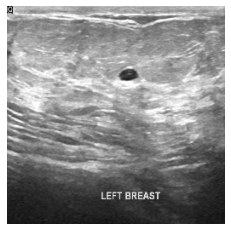

In [ ]:
#data exploring
print('image_paths ', image_paths[0])
showImage(loadOneImage(image_paths[0], SIZE))

image_paths  /content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (1).png
mask_paths  /content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (1).png


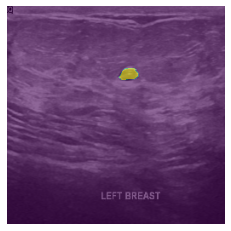

In [ ]:
#combine image and mask to show below
print('image_paths ', image_paths[0])
print('mask_paths ', image_paths[0])
showMask(loadOneImage(image_paths[0], SIZE), loadOneImage(mask_paths[0], SIZE)[:,:,0], alpha=0.6)

image_paths  /content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/malignant/malignant (156).png
mask_paths  /content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/malignant/malignant (156)_mask.png


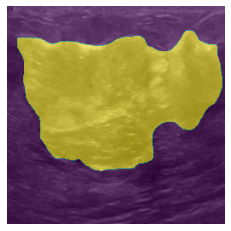

In [ ]:
#another example
print('image_paths ', image_paths[500])
print('mask_paths ', mask_paths[500])
showMask(loadOneImage(image_paths[500], SIZE), loadOneImage(mask_paths[500], SIZE)[:,:,0], alpha=0.6)

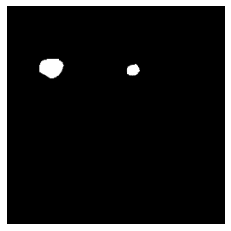

In [ ]:
#show two masks combine images
img_bg = np.zeros((1,SIZE,SIZE,3))
mask1 = loadOneImage('/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (4)_mask.png', SIZE)
mask2 = loadOneImage('/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (4)_mask_1.png', SIZE)

combined_mask = img_bg + mask1 + mask2
combined_mask = combined_mask[0,:,:,0]
showImage(combined_mask, cmap='gray')

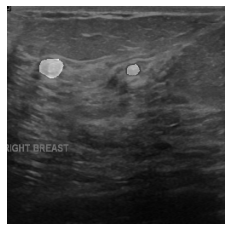

In [ ]:
#show image and two masks 
showImage(loadOneImage('/content/drive/MyDrive/DL/archive/Dataset_BUSI_with_GT/benign/benign (4).png', SIZE))
plt.imshow(combined_mask, cmap='gray', alpha=0.5)
plt.axis('off')
plt.show()

Load Images and Masks

In [ ]:
images = loadImages(image_paths, SIZE)
masks = loadImages(mask_paths, SIZE, mask=True)

In [ ]:
images.shape, masks.shape

((780, 256, 256, 3), (780, 256, 256, 1))

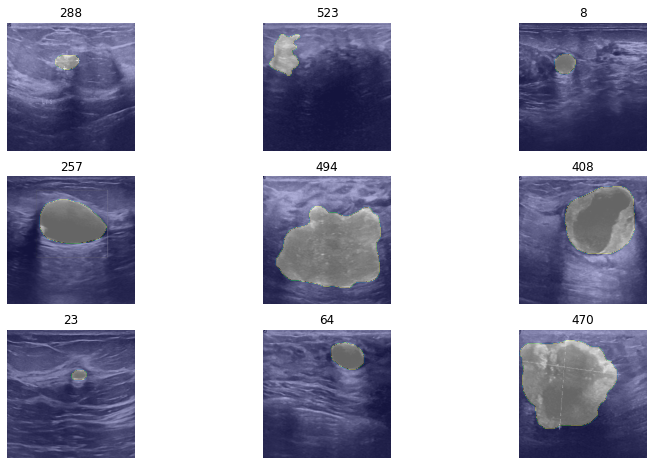

In [ ]:
#show images using different colors using cmap
plt.figure(figsize=(13,8))
for i in range(9):
    ax = plt.subplot(3,3,i+1)
    id = np.random.randint(len(images))
    ax.set_title(id)
    showMask(images[id], masks[id], cmap='terrain')
plt.show()

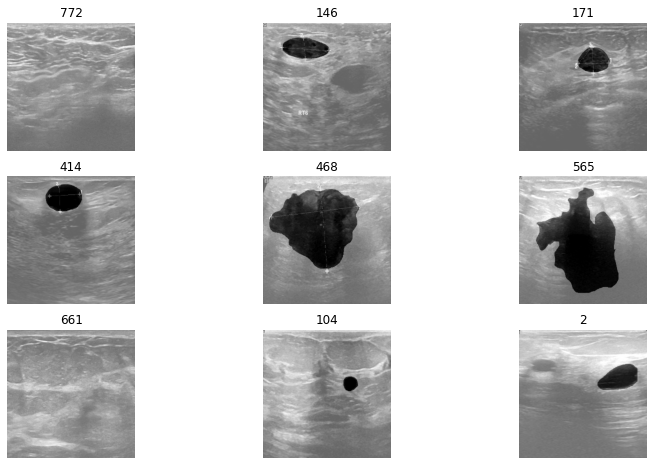

In [ ]:
#show images using different colors using cmap
plt.figure(figsize=(13,8))
for i in range(9):
    ax = plt.subplot(3,3,i+1)
    id = np.random.randint(len(images))
    ax.set_title(id)
    showMask(images[id], masks[id], cmap='binary')
plt.show()

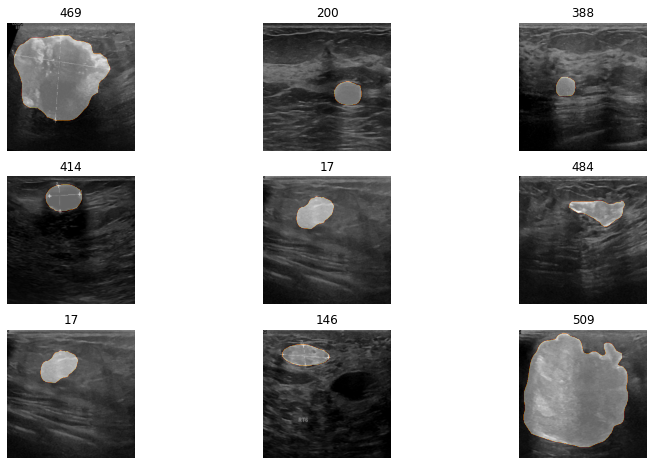

In [ ]:
#show images using different colors using cmap
plt.figure(figsize=(13,8))
for i in range(9):
    ax = plt.subplot(3,3,i+1)
    id = np.random.randint(len(images))
    ax.set_title(id)
    showMask(images[id], masks[id], cmap='afmhot')
plt.show()

# Train

In [ ]:
# total 780 images and size (256, 256, 3)
print(images.shape[-3:])
print(images.shape)

(256, 256, 3)
(780, 256, 256, 3)


In [ ]:
#define attention unet model 

def attention_unet(): 
  inputs = keras.Input(shape=(256, 256, 3))
  n_inputs = keras.layers.Lambda(lambda x: x / 255)(inputs)

  C1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(n_inputs)
  D1 = tf.keras.layers.Dropout(0.1)(C1)
  C12 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(D1)
  M1 = tf.keras.layers.MaxPooling2D((2, 2))(C12)

  C2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(M1)
  D2 = tf.keras.layers.Dropout(0.1)(C2)
  C22 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(D2)
  M2 = tf.keras.layers.MaxPooling2D((2, 2))(C22)
  
  C3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(M2)
  D3 = tf.keras.layers.Dropout(0.2)(C3)
  C32 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(D3)
  M3 = tf.keras.layers.MaxPooling2D((2, 2))(C32)
  
  C4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(M3)
  D4 = tf.keras.layers.Dropout(0.2)(C4)
  C42 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(D4)
  M4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(C42)
  
  C5 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(M4)
  D5 = tf.keras.layers.Dropout(0.3)(C5)
  C52 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(D5)

  #Expansive path 
  T6 = tf.keras.layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(C52)
  CO6 = tf.keras.layers.concatenate([T6, C42])
  C6 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(CO6)
  D6 = tf.keras.layers.Dropout(0.2)(C6)
  C62 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(D6)
  
  T7 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(C62)
  CO7 = tf.keras.layers.concatenate([T7, C32])
  C7 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(CO7)
  D7 = tf.keras.layers.Dropout(0.2)(C7)
  C72 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(D7)
  
  T8 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(C72)
  CO8 = tf.keras.layers.concatenate([T8, C22])
  C8 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(CO8)
  D8 = tf.keras.layers.Dropout(0.1)(C8)
  C82 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(C8)
  
  T9 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(C82)
  CO9 = tf.keras.layers.concatenate([T9, C12], axis=3)
  C9 = tf.keras.layers.Conv2D(32, (3, 3),name="Attention4", activation='relu', kernel_initializer='he_normal', padding='same')(CO9)
  D9 = tf.keras.layers.Dropout(0.1)(C9)
  C92 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(D9)
  
  outputs = tf.keras.layers.Conv2D(1, (1, 1),padding='same', activation='sigmoid')(C92)
  
  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')])

  model.summary()
  return model

model = attention_unet()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  896         ['lambda[0][0]']                 
                                )                                                                 
                                                                                              

In [ ]:
class report(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        explainer = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam_explain = explainer.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        #show results:
        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Image With Mask")
        showMask(image, mask, cmap='afmhot')

        plt.subplot(1,3,2)
        plt.title("Original Image With Predicted Mask")
        showMask(image, pred_mask, cmap='afmhot')

        plt.subplot(1,3,3)
        showImage(cam_explain, title="GradCAMCallback")

        plt.tight_layout()
        plt.show()


In [ ]:
cb = [
    ModelCheckpoint("AttentioUnetModel.h5", save_best_only=True),
    report()
]

BATCH_SIZE = 10
SPE = len(images)//BATCH_SIZE
print(SPE)

78


Epoch 1/25
 6/78 [=>............................] - ETA: 14s - loss: 0.2220 - accuracy: 0.9180 - IoU: 0.4602

1/1 [==============================] - 0s 24ms/step


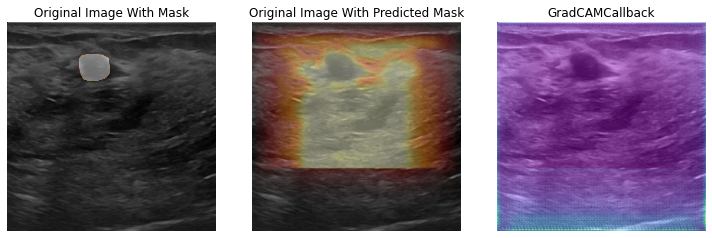

78/78 [==============================] - 19s 249ms/step - loss: 0.2334 - accuracy: 0.9074 - IoU: 0.4550 - val_loss: 0.1765 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 2/25
1/1 [==============================] - 0s 18ms/step


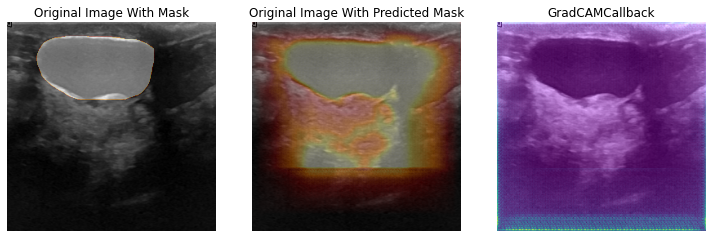

78/78 [==============================] - 18s 232ms/step - loss: 0.2323 - accuracy: 0.9059 - IoU: 0.4538 - val_loss: 0.1830 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 3/25
1/1 [==============================] - 0s 18ms/step


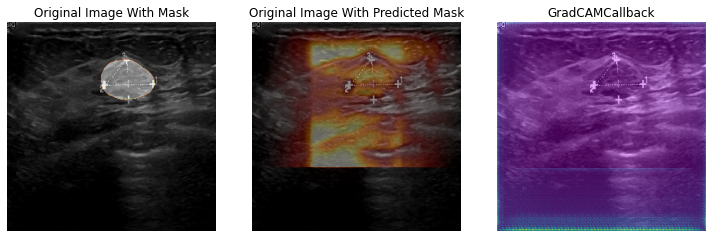

78/78 [==============================] - 19s 241ms/step - loss: 0.2242 - accuracy: 0.9121 - IoU: 0.4556 - val_loss: 0.1011 - val_accuracy: 0.9712 - val_IoU: 0.4909
Epoch 4/25
1/1 [==============================] - 0s 16ms/step


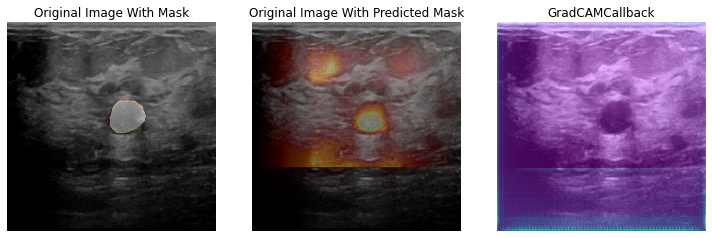

78/78 [==============================] - 19s 238ms/step - loss: 0.2272 - accuracy: 0.9110 - IoU: 0.4547 - val_loss: 0.1139 - val_accuracy: 0.9701 - val_IoU: 0.4909
Epoch 5/25
1/1 [==============================] - 0s 17ms/step


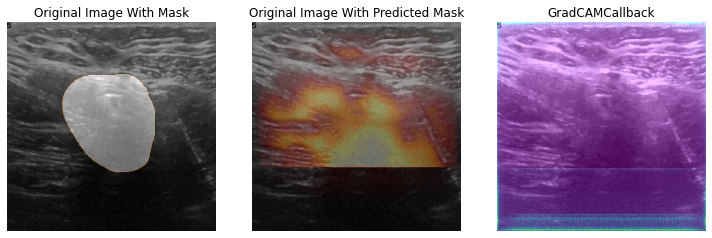

78/78 [==============================] - 18s 236ms/step - loss: 0.2186 - accuracy: 0.9120 - IoU: 0.4553 - val_loss: 0.0989 - val_accuracy: 0.9778 - val_IoU: 0.4909
Epoch 6/25
1/1 [==============================] - 0s 17ms/step


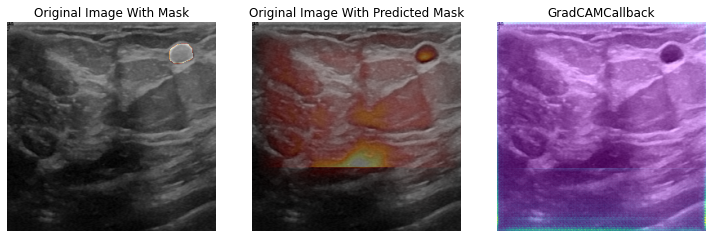

78/78 [==============================] - 18s 233ms/step - loss: 0.2099 - accuracy: 0.9198 - IoU: 0.4533 - val_loss: 0.1071 - val_accuracy: 0.9789 - val_IoU: 0.4909
Epoch 7/25
1/1 [==============================] - 0s 17ms/step


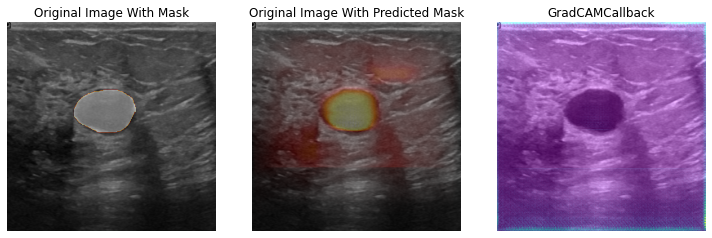

78/78 [==============================] - 18s 235ms/step - loss: 0.2232 - accuracy: 0.9104 - IoU: 0.4544 - val_loss: 0.1068 - val_accuracy: 0.9774 - val_IoU: 0.4909
Epoch 8/25
1/1 [==============================] - 0s 16ms/step


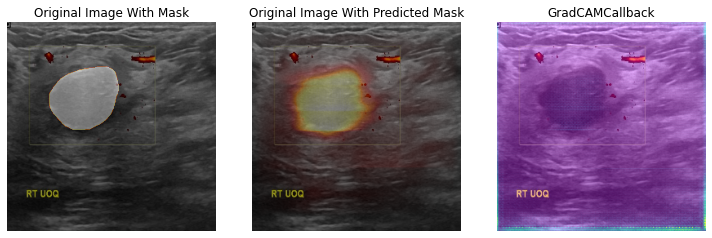

78/78 [==============================] - 18s 235ms/step - loss: 0.2020 - accuracy: 0.9243 - IoU: 0.4565 - val_loss: 0.1104 - val_accuracy: 0.9627 - val_IoU: 0.4909
Epoch 9/25
1/1 [==============================] - 0s 17ms/step


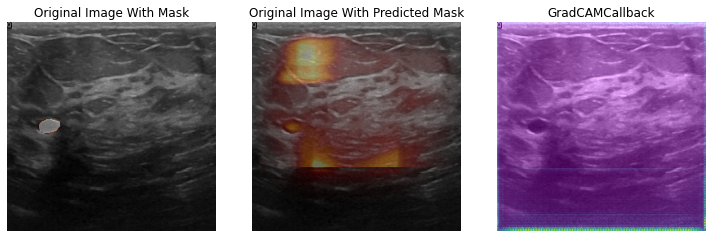

78/78 [==============================] - 18s 234ms/step - loss: 0.1975 - accuracy: 0.9246 - IoU: 0.4541 - val_loss: 0.1030 - val_accuracy: 0.9675 - val_IoU: 0.4909
Epoch 10/25
1/1 [==============================] - 0s 18ms/step


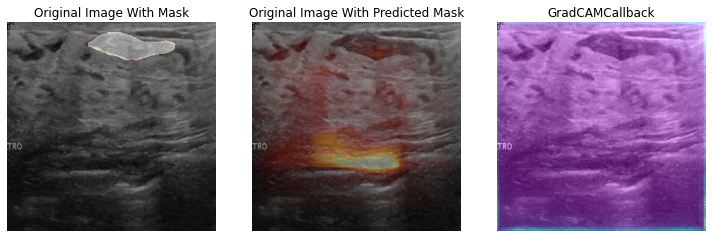

78/78 [==============================] - 18s 236ms/step - loss: 0.1926 - accuracy: 0.9251 - IoU: 0.4544 - val_loss: 0.1153 - val_accuracy: 0.9792 - val_IoU: 0.4909
Epoch 11/25
1/1 [==============================] - 0s 17ms/step


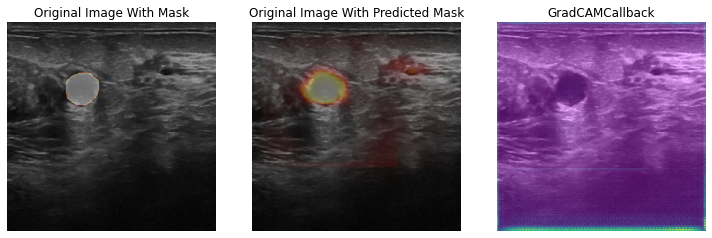

78/78 [==============================] - 19s 239ms/step - loss: 0.1883 - accuracy: 0.9297 - IoU: 0.4545 - val_loss: 0.0907 - val_accuracy: 0.9784 - val_IoU: 0.4909
Epoch 12/25
1/1 [==============================] - 0s 18ms/step


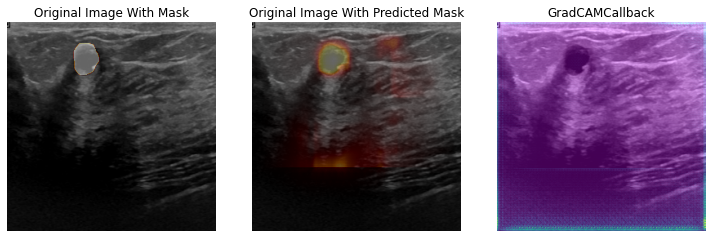

78/78 [==============================] - 19s 238ms/step - loss: 0.1708 - accuracy: 0.9370 - IoU: 0.4544 - val_loss: 0.0869 - val_accuracy: 0.9771 - val_IoU: 0.4909
Epoch 13/25
1/1 [==============================] - 0s 17ms/step


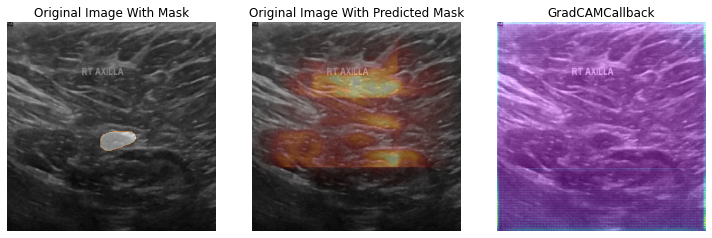

78/78 [==============================] - 18s 236ms/step - loss: 0.1660 - accuracy: 0.9379 - IoU: 0.4559 - val_loss: 0.0811 - val_accuracy: 0.9797 - val_IoU: 0.4909
Epoch 14/25
1/1 [==============================] - 0s 18ms/step


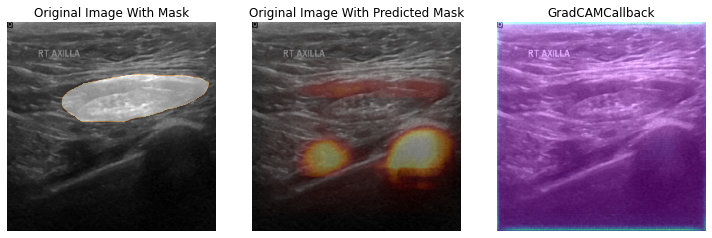

78/78 [==============================] - 18s 236ms/step - loss: 0.1675 - accuracy: 0.9366 - IoU: 0.4532 - val_loss: 0.1315 - val_accuracy: 0.9586 - val_IoU: 0.4909
Epoch 15/25
1/1 [==============================] - 0s 16ms/step


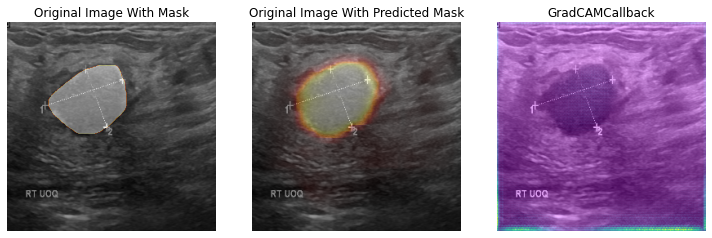

78/78 [==============================] - 18s 235ms/step - loss: 0.1636 - accuracy: 0.9396 - IoU: 0.4561 - val_loss: 0.1000 - val_accuracy: 0.9637 - val_IoU: 0.4909
Epoch 16/25
1/1 [==============================] - 0s 17ms/step


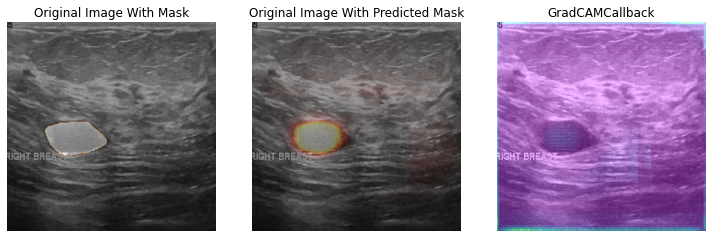

78/78 [==============================] - 18s 233ms/step - loss: 0.1692 - accuracy: 0.9373 - IoU: 0.4544 - val_loss: 0.1095 - val_accuracy: 0.9688 - val_IoU: 0.4909
Epoch 17/25
1/1 [==============================] - 0s 19ms/step


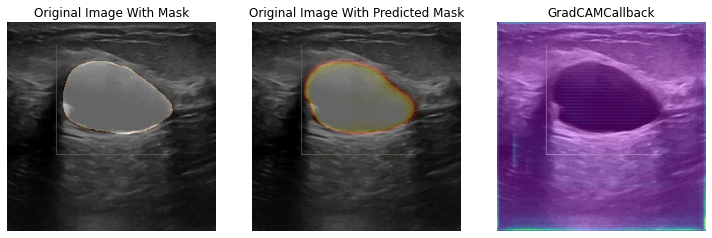

78/78 [==============================] - 19s 239ms/step - loss: 0.1574 - accuracy: 0.9416 - IoU: 0.4559 - val_loss: 0.0645 - val_accuracy: 0.9805 - val_IoU: 0.4909
Epoch 18/25
1/1 [==============================] - 0s 17ms/step


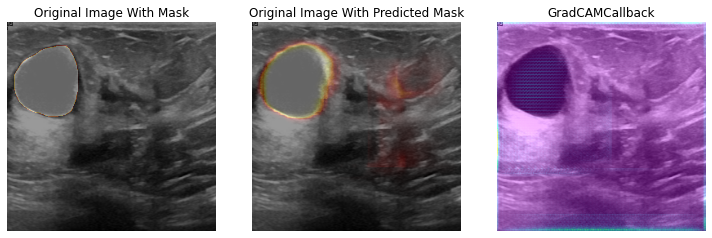

78/78 [==============================] - 18s 233ms/step - loss: 0.1479 - accuracy: 0.9442 - IoU: 0.4544 - val_loss: 0.0935 - val_accuracy: 0.9695 - val_IoU: 0.4909
Epoch 19/25
1/1 [==============================] - 0s 17ms/step


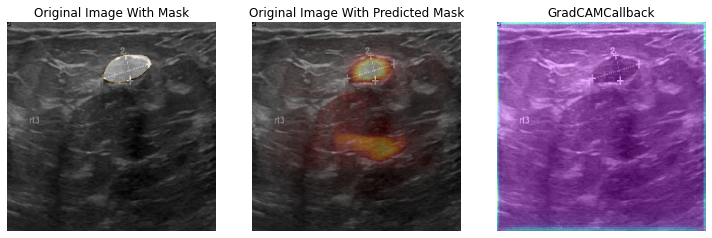

78/78 [==============================] - 18s 235ms/step - loss: 0.1451 - accuracy: 0.9463 - IoU: 0.4557 - val_loss: 0.0773 - val_accuracy: 0.9812 - val_IoU: 0.4909
Epoch 20/25
1/1 [==============================] - 0s 17ms/step


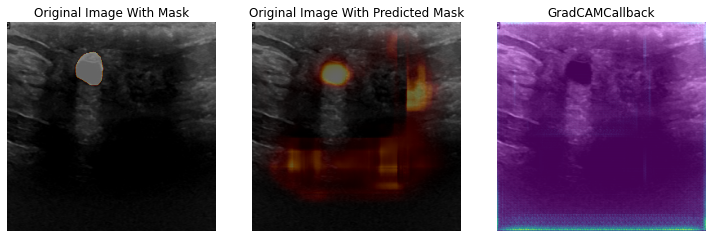

78/78 [==============================] - 18s 235ms/step - loss: 0.1422 - accuracy: 0.9475 - IoU: 0.4543 - val_loss: 0.0647 - val_accuracy: 0.9841 - val_IoU: 0.4909
Epoch 21/25
15/78 [====>.........................] - ETA: 13s - loss: 0.1382 - accuracy: 0.9473 - IoU: 0.4570

1/1 [==============================] - 0s 16ms/step


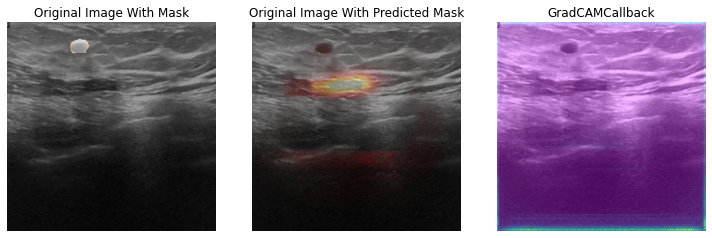

78/78 [==============================] - 5s 57ms/step - loss: 0.1382 - accuracy: 0.9473 - IoU: 0.4570 - val_loss: 0.0877 - val_accuracy: 0.9674 - val_IoU: 0.4909


In [ ]:
# Training
results_epo25 = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=25,
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

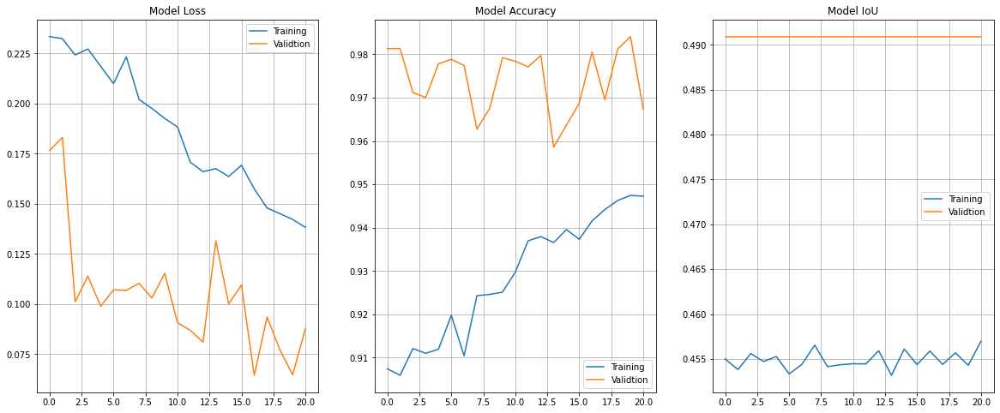

In [ ]:
train_loss, train_acc, train_iou, val_loss, val_acc, val_iou = results_epo25.history.values()

plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(train_loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(train_acc, label="Training")
plt.plot(val_acc, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(train_iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

# Initial experiments:

Epoch 1/20
1/1 [==============================] - 1s 1s/step


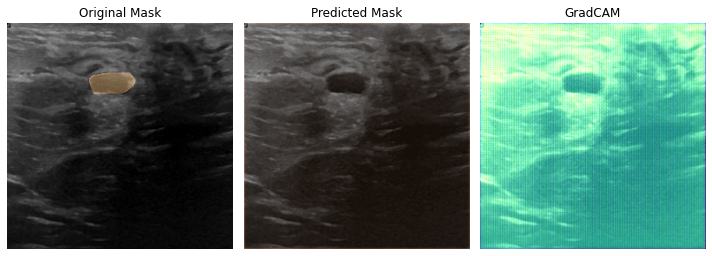

97/97 [==============================] - 36s 241ms/step - loss: 0.3825 - accuracy: 0.9063 - IoU: 0.4546 - val_loss: 0.1229 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 2/20
1/1 [==============================] - 0s 17ms/step


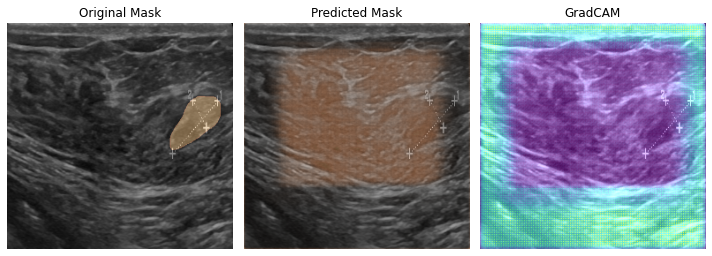

97/97 [==============================] - 19s 199ms/step - loss: 0.2727 - accuracy: 0.9070 - IoU: 0.4548 - val_loss: 0.1050 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 3/20
1/1 [==============================] - 0s 18ms/step


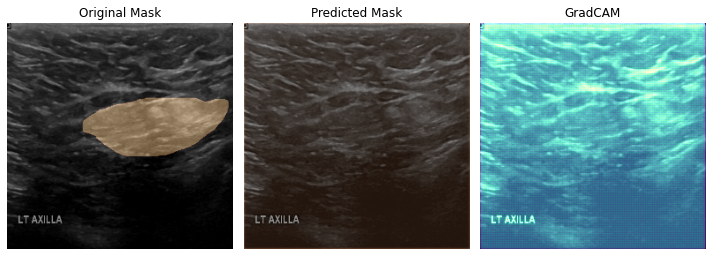

97/97 [==============================] - 19s 196ms/step - loss: 0.2808 - accuracy: 0.9072 - IoU: 0.4550 - val_loss: 0.1219 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 4/20
1/1 [==============================] - 0s 18ms/step


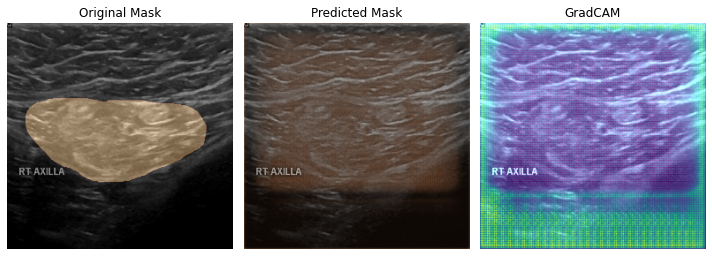

97/97 [==============================] - 19s 197ms/step - loss: 0.2916 - accuracy: 0.9071 - IoU: 0.4548 - val_loss: 0.1063 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 5/20
1/1 [==============================] - 0s 18ms/step


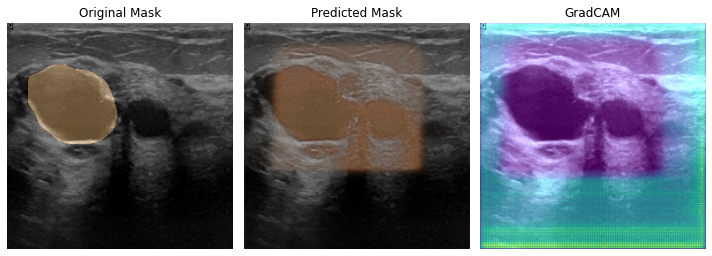

97/97 [==============================] - 20s 201ms/step - loss: 0.2498 - accuracy: 0.9072 - IoU: 0.4549 - val_loss: 0.1031 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 6/20
1/1 [==============================] - 0s 18ms/step


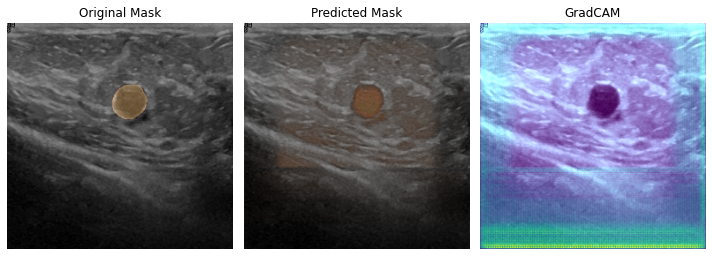

97/97 [==============================] - 20s 205ms/step - loss: 0.2403 - accuracy: 0.9029 - IoU: 0.4528 - val_loss: 0.0918 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 7/20
1/1 [==============================] - 0s 17ms/step


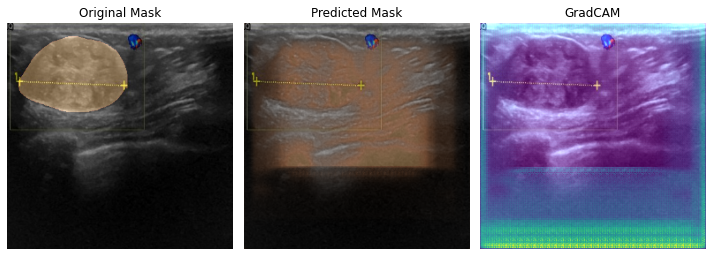

97/97 [==============================] - 20s 207ms/step - loss: 0.2251 - accuracy: 0.9098 - IoU: 0.4562 - val_loss: 0.1356 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 8/20
1/1 [==============================] - 0s 18ms/step


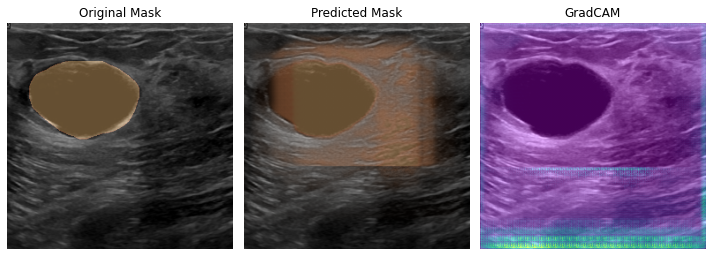

97/97 [==============================] - 20s 207ms/step - loss: 0.2235 - accuracy: 0.9076 - IoU: 0.4551 - val_loss: 0.1382 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 9/20
1/1 [==============================] - 0s 18ms/step


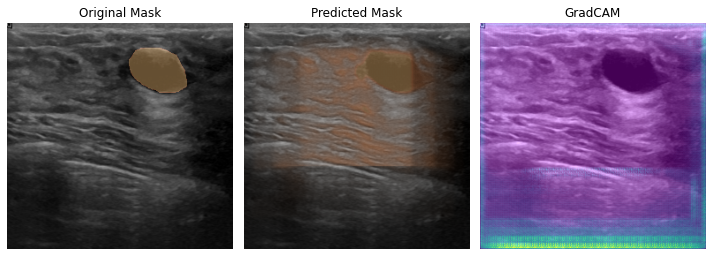

97/97 [==============================] - 20s 204ms/step - loss: 0.2266 - accuracy: 0.9062 - IoU: 0.4539 - val_loss: 0.1386 - val_accuracy: 0.9639 - val_IoU: 0.4909
Epoch 10/20
1/1 [==============================] - 0s 16ms/step


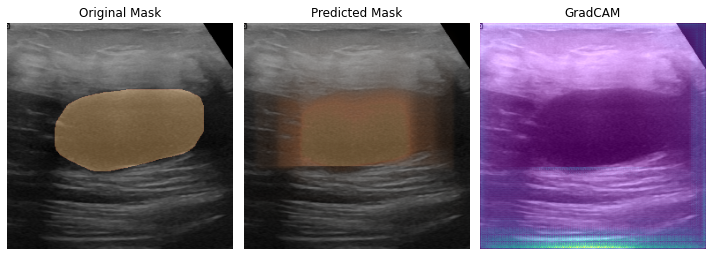

97/97 [==============================] - 20s 204ms/step - loss: 0.2211 - accuracy: 0.9139 - IoU: 0.4560 - val_loss: 0.1228 - val_accuracy: 0.9698 - val_IoU: 0.4909
Epoch 11/20
1/1 [==============================] - 0s 19ms/step


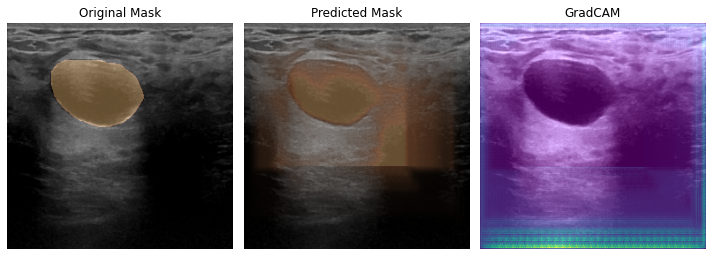

97/97 [==============================] - 20s 205ms/step - loss: 0.2255 - accuracy: 0.9126 - IoU: 0.4545 - val_loss: 0.1441 - val_accuracy: 0.9664 - val_IoU: 0.4909
Epoch 12/20
1/1 [==============================] - 0s 18ms/step


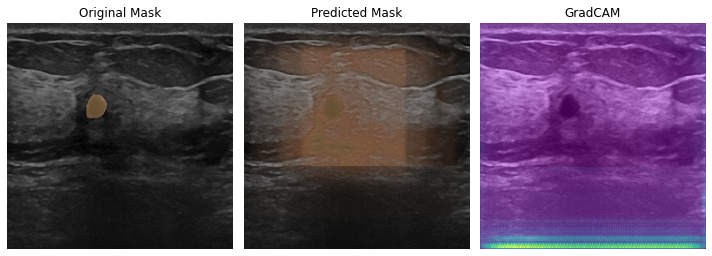

97/97 [==============================] - 20s 206ms/step - loss: 0.2291 - accuracy: 0.9095 - IoU: 0.4535 - val_loss: 0.1476 - val_accuracy: 0.9695 - val_IoU: 0.4909
Epoch 13/20
1/1 [==============================] - 0s 17ms/step


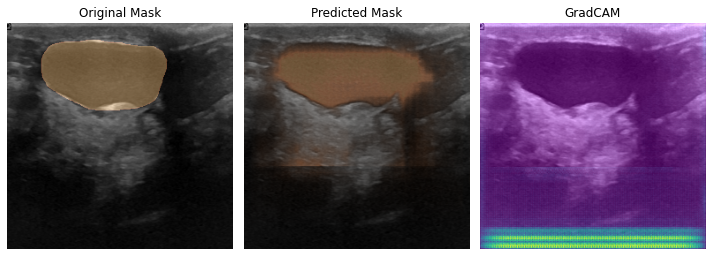

97/97 [==============================] - 20s 205ms/step - loss: 0.2302 - accuracy: 0.9119 - IoU: 0.4555 - val_loss: 0.1068 - val_accuracy: 0.9784 - val_IoU: 0.4909
Epoch 14/20
1/1 [==============================] - 0s 17ms/step


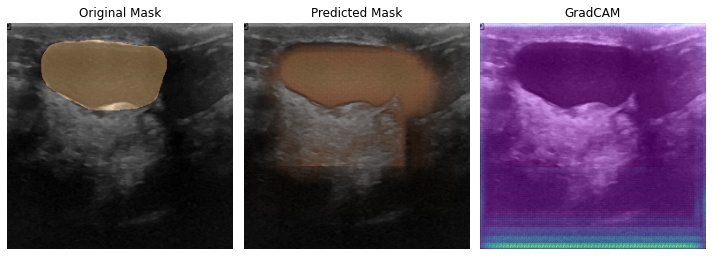

97/97 [==============================] - 20s 204ms/step - loss: 0.2290 - accuracy: 0.9106 - IoU: 0.4536 - val_loss: 0.1119 - val_accuracy: 0.9743 - val_IoU: 0.4909
Epoch 15/20
1/1 [==============================] - 0s 17ms/step


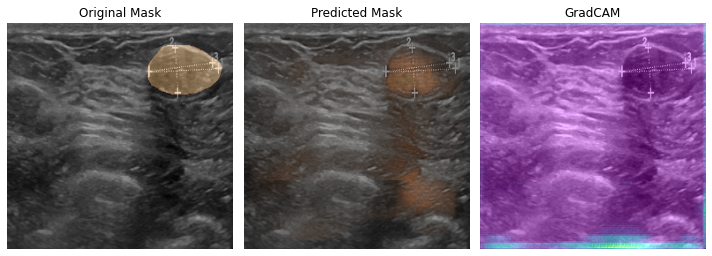

97/97 [==============================] - 20s 204ms/step - loss: 0.2101 - accuracy: 0.9191 - IoU: 0.4555 - val_loss: 0.1389 - val_accuracy: 0.9567 - val_IoU: 0.4909
Epoch 16/20
1/1 [==============================] - 0s 17ms/step


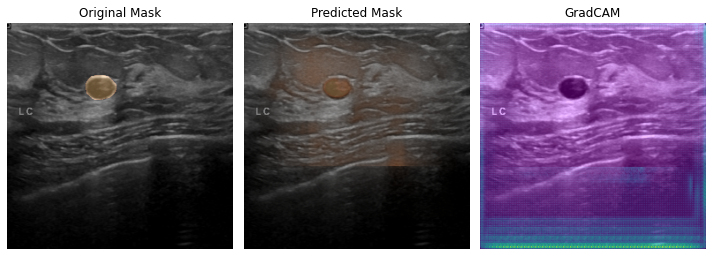

97/97 [==============================] - 20s 204ms/step - loss: 0.2071 - accuracy: 0.9203 - IoU: 0.4539 - val_loss: 0.0964 - val_accuracy: 0.9799 - val_IoU: 0.4909
Epoch 17/20
 8/97 [=>............................] - ETA: 16s - loss: 0.1639 - accuracy: 0.9428 - IoU: 0.4623

1/1 [==============================] - 0s 18ms/step


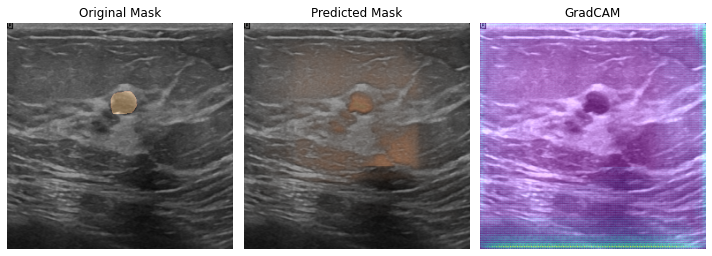

97/97 [==============================] - 3s 33ms/step - loss: 0.1639 - accuracy: 0.9428 - IoU: 0.4623 - val_loss: 0.0797 - val_accuracy: 0.9803 - val_IoU: 0.4909


In [ ]:
# Training with 20
results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=20,
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

In [ ]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()